# Imports

In [203]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Imagens utilizadas

In [200]:
image_paths = [
    'atividade_2_imgs/argentina_1.jpeg',
    'atividade_2_imgs/argentina_2.jpeg',
    'atividade_2_imgs/argentina_3.jpeg',
    'atividade_2_imgs/argentina_4.jpeg',
    'atividade_2_imgs/orla.jpeg',
    'atividade_2_imgs/massagueira.jpeg',
]

cropped_image_paths = [
    'atividade_2_imgs/cropped_argentina_1.jpeg',
    'atividade_2_imgs/cropped_argentina_2.jpeg',
    'atividade_2_imgs/cropped_argentina_3.jpeg',
    'atividade_2_imgs/cropped_argentina_4.jpeg',
    'atividade_2_imgs/cropped_orla.jpeg',
    'atividade_2_imgs/cropped_massagueira.jpeg',
]

In [210]:
cropped_image_folder = 'atividade_2_imgs/'

# Função para cortar o quadrado central da imagem
def crop_center_square(image, scale=0.5):
    h, w = image.shape[:2]
    min_side = min(h, w)
    
    new_side = int(min_side * scale)
    
    start_x = (w - new_side) // 2
    start_y = (h - new_side) // 2
    
    return image[start_y:start_y + new_side, start_x:start_x + new_side]

In [211]:
# Processo de corte e salvamento das imagens
for image_path in image_paths:
    # Carregando a imagem
    img = cv2.imread(image_path)
    # Cortando a imagem
    cropped_img = crop_center_square(img)
    # Salvando a imagem cortada na pasta de destino
    base_name = os.path.basename(image_path)
    cropped_path = os.path.join(cropped_image_folder, f"cropped_{base_name}")
    cv2.imwrite(cropped_path, cropped_img)

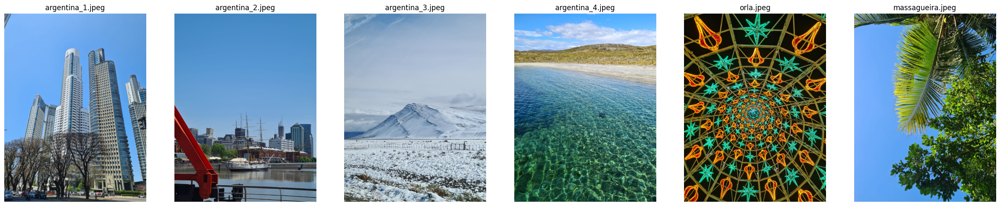

In [205]:
images = []
for image_path in image_paths:
    images.append(cv2.imread(image_path))

fig, axes = plt.subplots(nrows=1, ncols=6, figsize=(30, 30))
for ax, img, title in zip(axes.flat, images, image_paths):
    ax.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    ax.set_title(f"{title.split('/')[-1]}")
    ax.axis('off')

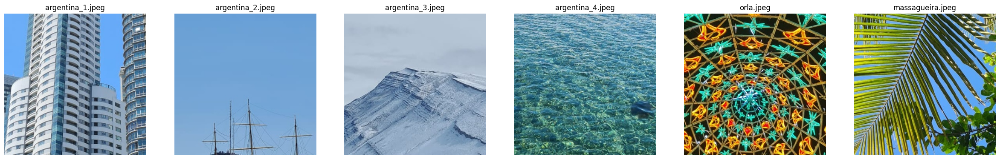

In [206]:
images = []
for image_path in cropped_image_paths:
    images.append(cv2.imread(image_path))

fig, axes = plt.subplots(nrows=1, ncols=6, figsize=(30, 30))
for ax, img, title in zip(axes.flat, images, image_paths):
    ax.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    ax.set_title(f"{title.split('/')[-1]}")
    ax.axis('off')

### 1. Na [documentação da OpenCV](https://docs.opencv.org/4.5.3/db/d27/tutorial_py_table_of_contents_feature2d.html) é possível encontrar diversos detectores e descritores. Usando um conjunto com pelo menos 6 imagens (você pode tirar fotos com seu telefone, por exemplo), experimente três detectores distintos nestas imagens, incluindo o detector de Harris. Pesquise e descreva resumidamente com suas palavras (até 200 palavras para cada) como cada um funciona, incluindo seus parâmetros e quais suas principais diferenças. Exiba resultados nas suas imagens, e em quais situações cada um funciona bem ou mal. Discuta seus parâmetros. Qual deles você achou melhor? Justifique.

In [165]:
harris_results = []
shi_tomasi_results = []
fast_results = []

### Harris Corner Detector

O Detector de Cantos de Harris é baseado na mudança de intensidade para uma janela de deslocamento $(u, v)$ em todas as direções. A função de autocorrelação $E(u, v)$ para a mudança de intensidade é dada por:

$E(u, v) = \sum_{x, y} w(x, y) \left[ I(x+u, y+v) - I(x, y) \right]^2$

onde $w(x, y)$ é uma função de ponderação, que pode ser uma janela retangular ou gaussiana, e $I(x, y)$ é a intensidade do pixel. Harris e Stephens propuseram uma medida de canto $R$, definida como:

$R = \det(M) - k(\text{trace}(M))^2$

onde $M$ é a matriz de segundo momento calculada pela soma dos produtos das derivadas da imagem, e $k$ é um parâmetro empírico que pode variar entre 0.04 a 0.06. O Detector de Cantos de Harris identifica variações de intensidade de imagem que correspondem a cantos, usando a seguinte função de resposta:

$ R = \lambda_1 \lambda_2 - k(\lambda_1 + \lambda_2)^2 $

onde $ \lambda_1 $ e $ \lambda_2 $ são os autovalores da matriz de segundo momento. Os principais parâmetros são:

- `blockSize`: O tamanho da vizinhança considerada para a detecção de cantos.
- `ksize`: O tamanho do kernel do filtro de Sobel usado para encontrar derivadas da imagem.
- `k`: O parâmetro livre do detector de Harris, que afeta a sensibilidade da detecção de cantos.

In [166]:
# Function to apply Harris Corner Detection and mark features on the colored image
def apply_harris_corner_detection(image_path):
    # Read image
    img_color = cv2.imread(image_path)
    img_gray = cv2.cvtColor(img_color, cv2.COLOR_BGR2GRAY)
    # Convert to float32
    img_float32 = np.float32(img_gray)
    # Apply Harris corner detector
    dst = cv2.cornerHarris(img_float32, blockSize=2, ksize=3, k=0.04)
    # Dilate the result to mark the corners
    dst = cv2.dilate(dst, None)
    # Mark corners on the color image
    img_color[dst > 0.01 * dst.max()] = [0, 0, 255]
    return img_color

### Shi-Tomasi Corner Detector (Good Features to Track)

O Detector Shi-Tomasi modifica a medida de canto do Harris para:

$R = \min(\lambda_1, \lambda_2)$

onde $\lambda_1$ e $\lambda_2$ são os autovalores da matriz $M$. Se $R$ é maior que um limiar de qualidade, o ponto é considerado um canto. Os parâmetros principais são:

- `maxCorners`: O número máximo de cantos a serem retornados.
- `qualityLevel`: Um valor entre 0 e 1 que especifica o limiar de qualidade mínimo dos cantos.
- `minDistance`: A distância euclidiana mínima entre cantos detectados.

In [167]:
def apply_shi_tomasi_corner_detection(image_path):
    # Read image
    img_color = cv2.imread(image_path)
    img_gray = cv2.cvtColor(img_color, cv2.COLOR_BGR2GRAY)
    # Apply Shi-Tomasi corner detection
    corners = cv2.goodFeaturesToTrack(img_gray, maxCorners=1000, qualityLevel=0.0001, minDistance=10)
    corners = np.intp(corners)
    # Draw circles on the color image
    for i in corners:
        x, y = i.ravel()
        cv2.circle(img_color, (x, y), 3, [0, 0, 255], -1)
    return img_color


### FAST Feature Detector

O Detector de Recursos FAST classifica um ponto $p$ como um canto se existirem $n$ pontos contíguos no círculo em torno de $p$ que são todos mais claros ou mais escuros que o valor do pixel de $p$ por um limiar $t$. O algoritmo verifica 16 pixels ao redor do ponto $p$ para rapidamente rejeitar candidatos a canto não promissores. A equação que define um ponto de canto é:

$I_p + t < I_n \quad \text{ou} \quad I_p - t > I_n$

onde $I_p$ é a intensidade do ponto central $p$ e $I_n$ são as intensidades dos pontos no círculo ao redor de $p$. Os parâmetros principais são:

- `threshold`: O limiar de intensidade para decidir se um ponto é um canto.
- `nonmaxSuppression`: Se verdadeiro, o algoritmo aplicará uma supressão não máxima aos cantos detectados.

In [168]:
def apply_fast_feature_detector(image_path):
    # Read image
    img_color = cv2.imread(image_path)
    img_gray = cv2.cvtColor(img_color, cv2.COLOR_BGR2GRAY)
    # Initiate FAST object with default values
    fast = cv2.FastFeatureDetector_create()
    # Find and draw the keypoints on the color image
    keypoints = fast.detect(img_gray, None)
    img_color = cv2.drawKeypoints(img_color, keypoints, None, color=(0, 0, 255))
    return img_color

**Diferenças principais entre Harris, Shi-Tomasi e FAST:**

A principal diferença entre os métodos de Harris e Shi-Tomasi é na medida usada para determinar os cantos. O método de Harris utiliza a combinação dos autovalores da matriz de segundo momento, enquanto Shi-Tomasi utiliza o menor autovalor diretamente, o que geralmente resulta em uma detecção de cantos mais confiável e é preferido para o rastreamento de recursos.

Já o FAST, diferentemente dos outros dois que são baseados em autovalores, utiliza um teste de intensidade rápida ao redor do ponto de interesse. Isso torna o FAST significativamente mais rápido, o que é vantajoso para aplicações em tempo real. No entanto, FAST pode não ser tão robusto quanto Harris ou Shi-Tomasi em relação à qualidade dos cantos detectados, especialmente em imagens com alto ruído ou texturas complexas.

In [169]:
for path in image_paths:
    harris_img= apply_harris_corner_detection(path)
    harris_results.append(harris_img)
    
    shi_tomasi_img = apply_shi_tomasi_corner_detection(path)
    shi_tomasi_results.append(shi_tomasi_img)
    
    fast_img = apply_fast_feature_detector(path)
    fast_results.append(fast_img)

**Shi-Tomasi:**

Funciona bem em:
- Imagens com boa iluminação e contrastes nítidos, como os arranha-céus e a estrutura de neve, onde há uma clara distinção entre os cantos dos edifícios e o céu ou a neve e as outras superfícies.
- Estruturas com geometria definida, pois pode identificar os vértices precisos das formas.

Funciona mal em:
- Imagens com muita textura ou padrões repetitivos, como a água e as folhagens, pois pode detectar muitos cantos "falsos" onde não há características distintas de interesse.
- Cenas com pouca variação de intensidade, pois pode não detectar cantos subtis.

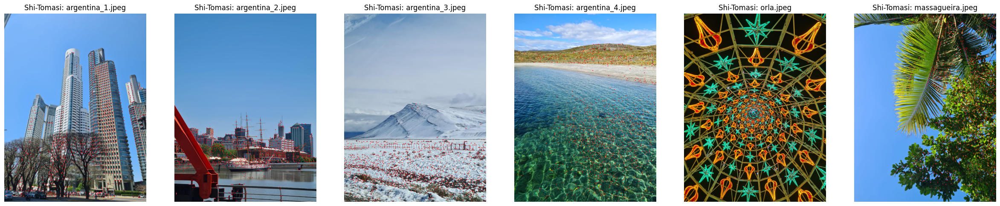

In [170]:
fig, axes = plt.subplots(nrows=1, ncols=6, figsize=(30, 30))
for ax, img, title in zip(axes.flat, shi_tomasi_results, image_paths):
    ax.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    ax.set_title(f"Shi-Tomasi: {title.split('/')[-1]}")
    ax.axis('off')

**Harris:**

Funciona bem em:
- Cenários urbanos onde há muitos cantos artificiais e bordas, como mostrado na imagem dos prédios.
- Ambientes com variação gradual de intensidade, como a montanha nevada, destacando as bordas das mudanças de inclinação.

Funciona mal em:
- Cenários naturais com muitos detalhes, como na imagem da folhagem, onde a alta resposta aos detalhes pode resultar em uma superdeteção de cantos.
- Imagens com alto ruído ou padrões complexos, já que pode resultar em muitos pontos de detecção devido à variação de intensidade no ruído.

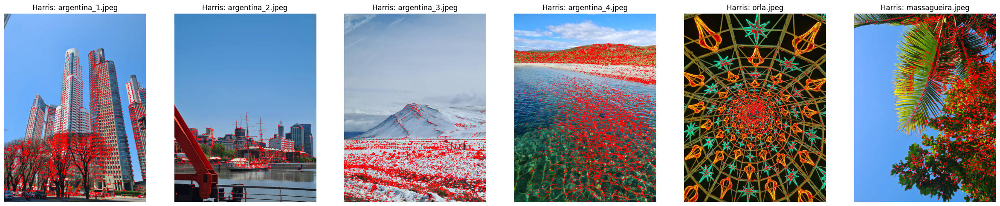

In [171]:
fig, axes = plt.subplots(nrows=1, ncols=6, figsize=(30, 30))

for ax, img, title in zip(axes.flat, harris_results, image_paths):
    ax.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    ax.set_title(f"Harris: {title.split('/')[-1]}")
    ax.axis('off')

**FAST:**

Funciona bem em:
- Situações de tempo real onde a velocidade de detecção é crítica, como no rastreamento de vídeo, devido à sua eficiência computacional.
- Imagens com características de alto contraste e bem definidas, como os detalhes arquitetônicos dos prédios.

Funciona mal em:
- Imagens com alto ruído, pois o FAST pode identificar muitos cantos devido a variações aleatórias de intensidade.
- Cenas com detalhes finos e complexos, como a água e a folhagem, onde o detector pode ser enganado pelos muitos detalhes que não são cantos úteis para rastreamento ou reconhecimento.

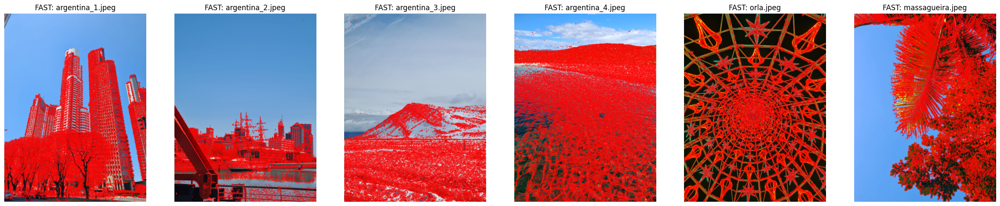

In [172]:
fig, axes = plt.subplots(nrows=1, ncols=6, figsize=(30, 30))
for ax, img, title in zip(axes.flat, fast_results, image_paths):
    ax.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    ax.set_title(f"FAST: {title.split('/')[-1]}")
    ax.axis('off')

Em resumo, Shi-Tomasi é preferível para aplicações onde a qualidade dos cantos é mais importante, Harris para cenários com variações de intensidade bem definidas e FAST quando a velocidade é essencial e pode-se tolerar uma maior taxa de falsos positivos. Baseado nos resultados apresentados, o método Shi-Tomasi parece ter tido um desempenho geral melhor. Ele demonstrou uma boa capacidade de identificar características relevantes em diferentes tipos de imagens, desde estruturas urbanas com linhas retas e ângulos definidos até paisagens naturais com variações mais sutis de textura e cor. 

O Shi-Tomasi é conhecido por sua robustez em identificar pontos que são bons para rastrear, o que é evidente nas imagens onde ele destacou cantos claros e distintos. Isso é particularmente útil em aplicações de visão computacional onde a precisão na detecção de cantos é crucial, como no rastreamento de objetos ou na reconstrução 3D.

Embora o FAST seja o mais rápido e eficiente computacionalmente, ele pode ter gerado muitos falsos positivos, especialmente em imagens com texturas complexas ou padrões repetitivos. O detector de Harris, por outro lado, embora seja confiável em detectar cantos em condições ideais, parece ter sido menos consistente na detecção em uma variedade de cenas, especialmente aquelas com muitos detalhes finos ou ruído. 

Portanto, considerando um equilíbrio entre precisão e robustez, o Shi-Tomasi parece ser o mais adequado para a maioria das situações apresentadas nas imagens.

### 2. Repita o mesmo procedimento acima para 3 tipos de descritores, incluindo o SIFT.

In [173]:
# Apply the descriptors to each image and collect the results
sift_results = []
orb_results = []
brisk_results = []

### SIFT (Scale-Invariant Feature Transform)

O SIFT é um método abrangente para detecção e descrição de características locais em imagens. Ele opera detectando extremos de espaço-escala usando a Diferença de Gaussianas (DoG), que é aproximadamente uma representação do Laplaciano do Gaussiano (LoG). A equação para DoG é:

$ \text{DoG}(x, y, \sigma) = L(x, y, k\sigma) - L(x, y, \sigma) $

onde $ L $ é a imagem suavizada por Gauss, $ \sigma $ é a escala e $ k $ é um fator multiplicativo constante. Após a detecção dos pontos-chave, cada ponto é descrito por um vetor de recursos que captura as informações de gradiente locais.

**Principais parâmetros:**
- Número de níveis de escala na pirâmide de escala.
- O limite de contraste para a detecção de pontos-chave.
- O limiar de borda para filtrar pontos-chave que são bordas.

In [174]:
# Initialize the SIFT feature detector
sift = cv2.SIFT_create()

# Function to apply SIFT descriptor and return keypoints and descriptors
def apply_sift_descriptor(image_path):
    img = cv2.imread(image_path)
    gray= cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
    kp = sift.detect(gray, None)
    img=cv2.drawKeypoints(gray,kp,img,flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS )
    return img

### ORB (Oriented FAST and Rotated BRIEF)

ORB combina o detector de cantos FAST com o descritor BRIEF, mas adiciona uma orientação e usa uma versão rotacionada do BRIEF para invariância à rotação. A detecção de cantos com FAST é realizada procurando pixels que se destaquem em relação ao seu entorno circular. A orientação é calculada com base no momento centralizado de patch.

**Principais parâmetros:**
- O número máximo de pontos-chave a serem detectados.
- O nível de pirâmide (escala) para a detecção.
- A pontuação do patch para a seleção do ponto-chave.

In [175]:
# Initialize the ORB feature detector
orb = cv2.ORB_create()

# Function to apply ORB descriptor and return keypoints and descriptors
def apply_orb_descriptor(image_path):
    img = cv2.imread(image_path)
    gray= cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
    kp = orb.detect(gray, None)
    img=cv2.drawKeypoints(gray,kp,img,flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS )
    return img

### BRISK (Binary Robust Invariant Scalable Keypoints)

BRISK é um método de detecção e descrição de características que realiza uma amostragem rápida de pontos em uma imagem para criar descritores binários. O descritor BRISK é formado pela comparação de intensidades de pixels em um padrão predefinido que se mantém consistente através de escalas e rotações.

**Principais parâmetros:**
- O raio do padrão utilizado para a amostragem de pontos.
- O número de pontos no padrão.
- O limiar de detecção de cantos.

In [176]:
# Initialize the BRISK feature detector
brisk = cv2.BRISK_create()

# Function to apply BRISK descriptor and return keypoints and descriptors
def apply_brisk_descriptor(image_path):
    img = cv2.imread(image_path)
    gray= cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
    kp = brisk.detect(gray, None)
    img=cv2.drawKeypoints(gray,kp,img,flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS )
    return img

**Diferenças principais entre SIFT, ORB e BRISK:**

As principais diferenças entre os métodos SIFT, ORB e BRISK são em como eles detectam pontos de interesse (keypoints) nas imagens e como descrevem esses pontos para reconhecimento posterior ou correspondência.

- **Invariância à Escala e Rotação**: SIFT é totalmente invariante à escala e rotação. BRISK é projetado para ser invariante à escala e rotação, mas pode não ser tão eficaz quanto o SIFT. ORB é invariante à rotação, mas não é projetado para ser invariante à escala.
- **Desempenho Computacional**: ORB e BRISK são projetados para serem mais rápidos e menos intensivos em termos de computação do que SIFT, tornando-os mais adequados para aplicações em tempo real.
- **Robustez**: SIFT tende a ser mais robusto em diferentes condições de imagem, mas a custo de maior complexidade de cálculo. ORB e BRISK são menos robustos em termos de precisão e repetibilidade em ambientes com alterações drásticas de escala, rotação e iluminação.

In [177]:
for path in image_paths:
    sift_img = apply_sift_descriptor(path)
    sift_results.append(sift_img)
    
    orb_img= apply_orb_descriptor(path)
    orb_results.append(orb_img)
    
    brisk_img = apply_brisk_descriptor(path)
    brisk_results.append(brisk_img)

### SIFT

Funciona bem em:

  - Estruturas arquitetônicas e cenas urbanas, como os arranha-céus, devido à sua invariância à escala e rotação.
  - Paisagens naturais com variações claras de textura, como as montanhas nevadas, onde os gradientes são distintos.

Funciona mal em:

  - Cenas com alto ruído ou padrões complexos e repetitivos, como a folhagem, onde pode detectar muitos pontos que não são úteis para rastreamento ou reconhecimento.

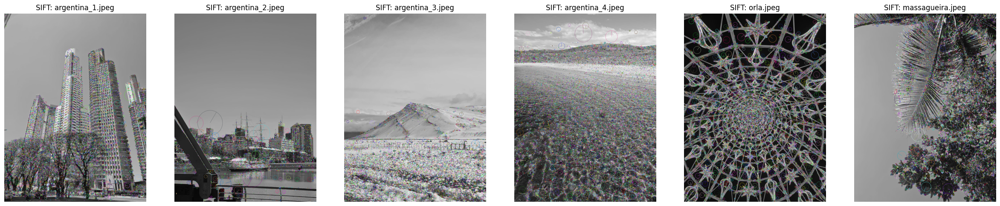

In [178]:
fig, axes = plt.subplots(nrows=1, ncols=6, figsize=(30, 30))
for ax, img, title in zip(axes.flat, sift_results, image_paths):
    ax.imshow(img)
    ax.set_title(f"SIFT: {title.split('/')[-1]}")
    ax.axis('off')

### ORB

Funciona bem em:

  - Ambientes onde a velocidade de processamento é crítica, como sistemas de rastreamento em tempo real, devido à sua eficiência computacional.
  - Identificação de características em imagens com bom contraste e pouca variação de escala.

Funciona mal em:

  - Cenas com variações de escala, pois o ORB não é invariante à escala.
  - Imagens com iluminação inconsistente ou onde a invariância à rotação é crítica.

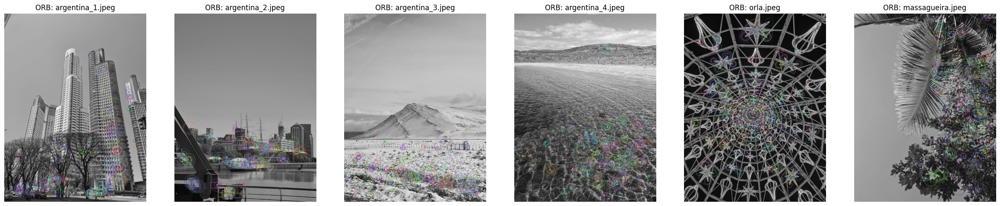

In [179]:
fig, axes = plt.subplots(nrows=1, ncols=6, figsize=(30, 30))
for ax, img, title in zip(axes.flat, orb_results, image_paths):
    ax.imshow(img)
    ax.set_title(f"ORB: {title.split('/')[-1]}")
    ax.axis('off')

### BRISK

Funciona bem em:

  - Detecção rápida de características em várias escalas, sendo uma boa alternativa quando o SIFT é muito lento.
  - Cenas onde é necessário um equilíbrio entre invariância de escala e eficiência de processamento.

Funciona mal em:

  - Cenas com detalhes extremamente finos, onde a representação binária do BRISK pode não ser suficientemente discriminativa.
  - Cenários onde a precisão máxima dos descritores é necessária, pois o SIFT pode fornecer informações mais detalhadas.

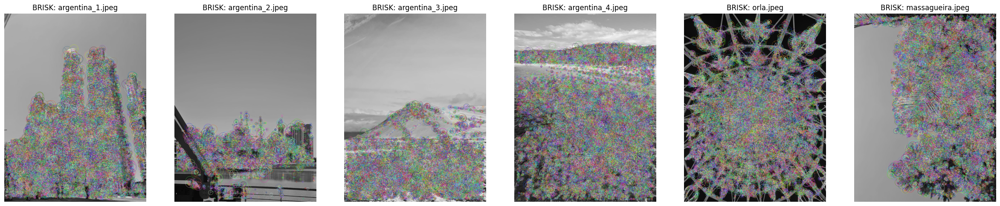

In [180]:
fig, axes = plt.subplots(nrows=1, ncols=6, figsize=(30, 30))
for ax, img, title in zip(axes.flat, brisk_results, image_paths):
    ax.imshow(img)
    ax.set_title(f"BRISK: {title.split('/')[-1]}")
    ax.axis('off')

Baseado nos resultados visuais fornecidos, o SIFT parece ter se saído melhor, pois conseguiu identificar uma grande quantidade de características relevantes em uma variedade de cenas, desde ambientes urbanos até paisagens naturais. Isso indica uma robustez particularmente forte em termos de invariância à escala e à rotação, além de ser capaz de fornecer descritores detalhados que são úteis para reconhecimento e correspondência precisos. 

O ORB, embora tenha identificado um número significativo de pontos de interesse e seja mais rápido que o SIFT, pode ter perdido algumas características importantes, especialmente em cenas com variações de escala ou iluminação complexa. Além disso, os descritores ORB são menos robustos contra mudanças severas de perspectiva, o que pode ser uma desvantagem em aplicações que exigem uma alta precisão de correspondência de características. 

O BRISK, por outro lado, parece ter identificado menos características em comparação com o SIFT e, embora seja mais rápido, pode não ter a mesma riqueza de detalhes em seus descritores, o que pode afetar a precisão em tarefas de reconhecimento e correspondência. 

Portanto, para aplicações onde a precisão e a qualidade dos descritores são críticas e as limitações computacionais não são um grande impedimento, o SIFT seria a escolha mais adequada baseada nos resultados apresentados.

### 3. Repita o mesmo procedimento acima para 3 algoritmos de gerção de correspondências (matching).

In [226]:
# Apply the descriptors to each image and collect the results
bfm_orb_results = []
bfm_sift_results = []
flann_bm_results = []

### Brute-Force Matching with ORB Descriptors

O Brute-Force Matcher com descritores ORB compara descritores binários utilizando a distância de Hamming como métrica. Este método é exaustivo, pois cada descritor da primeira imagem é comparado com todos os descritores da segunda imagem para encontrar as melhores correspondências.

**Principais Parâmetros:**
- `cv2.NORM_HAMMING`: Especifica o uso da distância de Hamming, ideal para descritores binários como ORB.
- `crossCheck`: Um parâmetro booleano que, quando verdadeiro, o matcher retorna apenas aquelas correspondências com valor de distância menor do que um limiar especificado e onde o par é o melhor match em ambas as direções.

In [221]:
def BFMatcher_orb(img1, img2):
    orb = cv2.ORB_create()
    kp1, des1 = orb.detectAndCompute(img1,None)
    kp2, des2 = orb.detectAndCompute(img2,None)

    # create BFMatcher object
    bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)
    # Match descriptors.
    matches = bf.match(des1,des2)
    # Sort them in the order of their distance.
    matches = sorted(matches, key = lambda x:x.distance)
    # Draw first 10 matches.
    img3 = cv2.drawMatches(img1,kp1,img2,kp2,matches[:10],None,flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
    
    return img3

### Brute-Force Matching with SIFT Descriptors and Ratio Test

Este método utiliza descritores SIFT e a distância Euclidiana para encontrar correspondências, com a adição do teste de razão de Lowe para filtrar matches. Isso ajuda a reter correspondências de alta qualidade.

**Principais Parâmetros:**
- `cv2.NORM_L2`: Utiliza a distância Euclidiana para descritores SIFT, que são de ponto flutuante.
- Ratio Test: O teste de proporção compara a distância do melhor match com a distância do segundo melhor match. Uma correspondência é considerada boa se a proporção entre as distâncias for menor que um valor limiar (geralmente 0,75).

In [222]:
def BFMatcher_sift(img1, img2):
    # Initiate SIFT detector
    sift = cv2.SIFT_create()
    # find the keypoints and descriptors with SIFT
    kp1, des1 = sift.detectAndCompute(img1,None)
    kp2, des2 = sift.detectAndCompute(img2,None)

    # BFMatcher with default params
    bf = cv2.BFMatcher()
    matches = bf.knnMatch(des1,des2,k=2)
    # Apply ratio test
    good = []
    for m,n in matches:
        if m.distance < 0.75*n.distance:
            good.append([m])
    # cv.drawMatchesKnn expects list of lists as matches.
    img3 = cv2.drawMatchesKnn(img1,kp1,img2,kp2,good,None,flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

    return img3

### FLANN based Matcher

O FLANN é uma abordagem eficiente para encontrar correspondências aproximadas mais rapidamente em grandes conjuntos de dados. Ele utiliza estruturas de dados de árvores para acelerar a busca de vizinhos mais próximos.

**Principais Parâmetros:**
- `index_params`: Um dicionário que define o algoritmo de indexação e seus parâmetros específicos, como o número de árvores na floresta aleatória.
  - `algorithm`: Define o algoritmo de busca, como FLANN_INDEX_KDTREE para árvores KD.
  - `trees`: O número de árvores a ser construído, um parâmetro específico para o índice KD-Tree.
- `search_params`: Um dicionário que define os parâmetros de busca.
  - `checks`: O número de vezes que o algoritmo iterativo verifica os vizinhos próximos. Um valor mais alto significa uma busca mais precisa, mas também mais lenta.

In [223]:
def BM_flann(img1, img2):
    FLANN_INDEX_KDTREE = 1
    index_params = dict(algorithm = FLANN_INDEX_KDTREE, trees = 5)
    FLANN_INDEX_LSH = 6
    index_params = dict(algorithm = FLANN_INDEX_LSH,
                    table_number = 6,
                    key_size = 12,   
                    multi_probe_level = 1)
    
    # Initiate SIFT detector
    sift = cv2.SIFT_create()
    # find the keypoints and descriptors with SIFT
    kp1, des1 = sift.detectAndCompute(img1,None)
    kp2, des2 = sift.detectAndCompute(img2,None)
    # FLANN parameters
    FLANN_INDEX_KDTREE = 1
    index_params = dict(algorithm = FLANN_INDEX_KDTREE, trees = 5)
    search_params = dict(checks=50)   # or pass empty dictionary
    flann = cv2.FlannBasedMatcher(index_params,search_params)
    matches = flann.knnMatch(des1,des2,k=2)
    # Need to draw only good matches, so create a mask
    matchesMask = [[0,0] for i in range(len(matches))]
    # ratio test as per Lowe's paper
    for i,(m,n) in enumerate(matches):
        if m.distance < 0.7*n.distance:
            matchesMask[i]=[1,0]
    draw_params = dict(matchColor = (0,255,0),
                    singlePointColor = (255,0,0),
                    matchesMask = matchesMask,
                    flags = cv2.DrawMatchesFlags_DEFAULT)
    img3 = cv2.drawMatchesKnn(img1,kp1,img2,kp2,matches,None,**draw_params)
    return img3

As principais diferenças entre Brute-Force Matching com descritores ORB, Brute-Force Matching com descritores SIFT e Ratio Test, e FLANN based Matcher são relacionadas ao método de busca e comparação de descritores, bem como sua eficiência e precisão.

1. **Brute-Force Matching com ORB**:
   - **Eficiência**: Mais eficiente com descritores binários.
   - **Precisão**: Menos preciso em comparação com SIFT, pois ORB é menos robusto a variações de escala e rotação.
   - **Uso**: Melhor para aplicações em tempo real onde a velocidade é mais crítica do que a precisão absoluta.
   - **Parâmetro Chave**: Usa a distância de Hamming para a comparação de descritores binários.

2. **Brute-Force Matching com SIFT e Ratio Test**:
   - **Eficiência**: Menos eficiente do que ORB e FLANN devido à complexidade dos descritores SIFT e ao processo de teste de razão.
   - **Precisão**: Muito preciso, captura a variação de intensidade local de forma mais detalhada, tornando-o adequado para correspondência precisa.
   - **Uso**: Ideal para aplicações onde a precisão de correspondência é de suma importância.
   - **Parâmetro Chave**: Usa o teste de razão para filtrar correspondências, melhorando a qualidade das correspondências encontradas.

3. **FLANN based Matcher**:
   - **Eficiência**: Projetado para ser rápido em grandes conjuntos de dados, usando algoritmos de vizinhos mais próximos aproximados.
   - **Precisão**: Pode ser menos preciso do que o matching exaustivo, mas é geralmente suficiente para muitas aplicações.
   - **Uso**: A melhor escolha para grandes bases de dados onde o matching Brute-Force seria proibitivamente lento.
   - **Parâmetro Chave**: Configurações de `index_params` e `search_params` que podem ser ajustadas para equilibrar entre velocidade e precisão.

In [227]:
for normal_path, cropped_path in zip(image_paths, cropped_image_paths):
    img1 = cv2.imread(cropped_path,cv2.IMREAD_GRAYSCALE) # queryImage
    img2 = cv2.imread(normal_path,cv2.IMREAD_GRAYSCALE) # trainImage

    bfm_orb_img = BFMatcher_orb(img1, img2)
    bfm_orb_results.append(bfm_orb_img)
    
    bfm_sift_img = BFMatcher_sift(img1, img2)
    bfm_sift_results.append(bfm_sift_img)
    
    flann_bm_img = BM_flann(img1, img2)
    flann_bm_results.append(flann_bm_img)

**Brute-Force Matching with ORB Descriptors**:

Funciona bem em: 
    
- Cenas com contraste forte e características bem definidas, pois os descritores ORB são eficientes na detecção de padrões binários e rápidos para comparação.

Funciona mal em: 

- Imagens com muita textura ou detalhes finos, onde o número de descritores binários pode ser insuficiente para cobrir a complexidade da imagem ou pode resultar em correspondências incorretas devido à similaridade de padrões repetitivos.

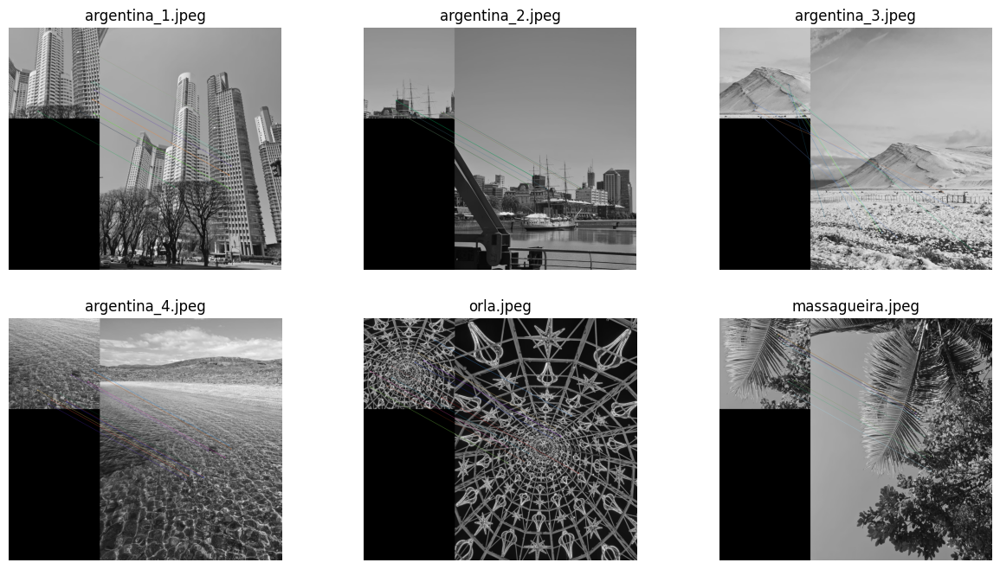

In [245]:
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(15, 8))
for ax, img, title in zip(axes.flat, bfm_orb_results, image_paths):
    ax.imshow(img)
    ax.set_title(f"{title.split('/')[-1]}")
    ax.axis('off')

**Brute-Force Matching with SIFT Descriptors and Ratio Test**:

Funciona bem em: 

- Imagens com variações sutis de textura e escala, onde os descritores SIFT são capazes de capturar detalhes mais finos e o Ratio Test pode ajudar a eliminar correspondências incorretas.

Funciona mal em: 

- Cenários onde o tempo de processamento é um fator crítico, pois SIFT é computacionalmente mais intensivo do que ORB e o Ratio Test adiciona uma camada extra de cálculo.

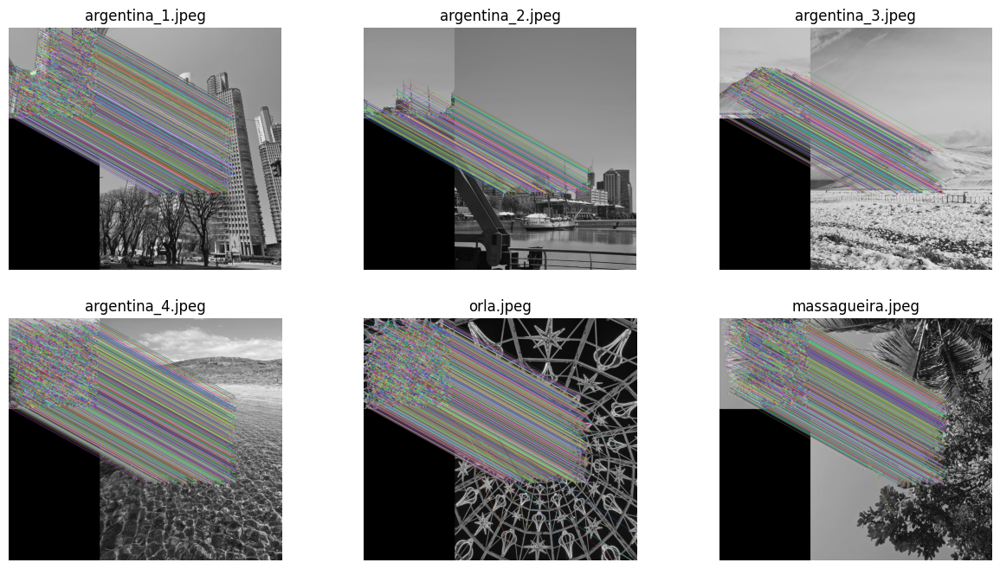

In [241]:
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(15, 8))
for ax, img, title in zip(axes.flat, bfm_sift_results, image_paths):
    ax.imshow(img)
    ax.set_title(f"{title.split('/')[-1]}")
    ax.axis('off')

**FLANN based Matcher**:

Funciona bem em: 

- Grandes conjuntos de dados onde uma busca rápida por correspondências aproximadas é necessária. FLANN é otimizado para eficiência em tempo de execução, tornando-o adequado para aplicações em tempo real.

Funciona mal em: 

- Casos em que é necessária a máxima precisão de correspondência, pois FLANN pode retornar correspondências aproximadas que não são as melhores possíveis.

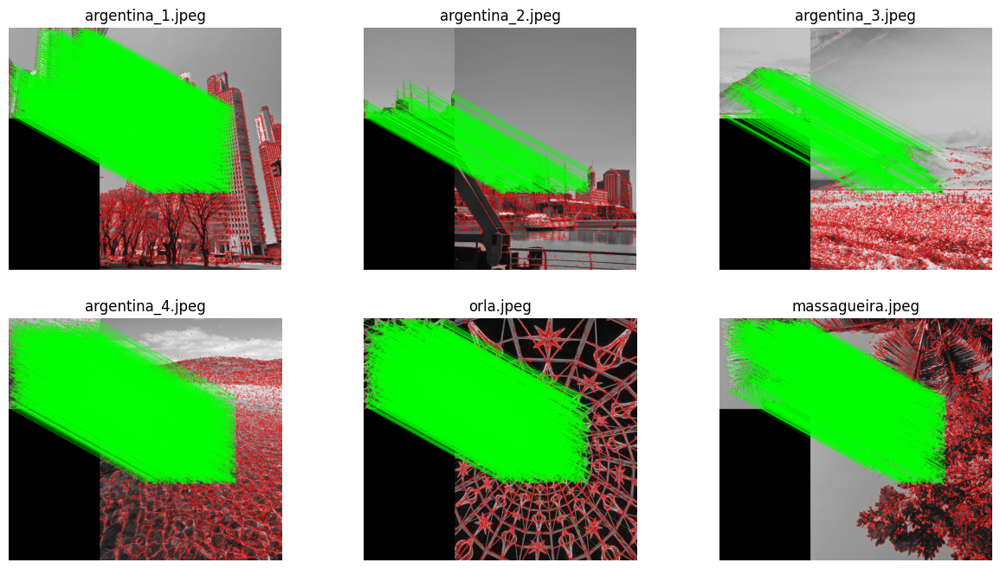

In [242]:
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(15, 8))
for ax, img, title in zip(axes.flat, flann_bm_results, image_paths):
    ax.imshow(img)
    ax.set_title(f"{title.split('/')[-1]}")
    ax.axis('off')

Com base nos resultados visuais apresentados, o Brute-Force Matching com ORB mostrou muitas linhas de correspondência, indicando um alto número de matches, mas parece haver algumas correspondências incorretas, o que pode ser resultado da natureza menos discriminativa dos descritores ORB em comparação com o SIFT. Este método é rápido e eficiente, mas pode não ser o mais preciso em todas as situações.

O Brute-Force Matching com SIFT e Ratio Test parece ter produzido linhas de correspondência mais consistentes e precisas. O uso do Ratio Test ajuda a filtrar correspondências menos confiáveis, resultando em uma melhor qualidade de correspondência. Apesar de ser mais lento e computacionalmente intensivo, o SIFT tende a ser mais confiável em termos de precisão e robustez.

O FLANN based Matcher também mostrou bons resultados, com muitas linhas de correspondência consistentes, o que indica uma boa performance geral. Este método é uma ótima escolha para conjuntos de dados grandes onde o desempenho é uma preocupação, pois fornece um bom equilíbrio entre velocidade e precisão.

Considerando a qualidade e consistência das correspondências, o **Brute-Force Matching com SIFT e Ratio Test** parece ser o melhor dos três métodos para as imagens fornecidas. Ele fornece correspondências precisas e é robusto contra variações de escala e rotação, o que é essencial para muitas aplicações de visão computacional. No entanto, se a eficiência de tempo for uma consideração importante, o FLANN based Matcher pode ser uma escolha mais apropriada.